In [37]:
import os
import random
import warnings
import glob
import time

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.utils import plot_model
import tensorflow_addons as tfa

import sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    classification_report, precision_recall_fscore_support,
    accuracy_score, f1_score, matthews_corrcoef,
    confusion_matrix, ConfusionMatrixDisplay
)
from scikitplot.metrics import plot_roc

In [38]:
# Mute warnings
warnings.filterwarnings("ignore", "is_categorical_dtype")
warnings.filterwarnings("ignore", "use_inf_as_na")
plt.style.use("dark_background")

In [39]:
# View package versions
versions = {
    'package': [
        'pandas', 'numpy', 
        'sklearn', 'seaborn', 
        'tensorflow', 'tensorflow_addons',
        ],
    'version': [
        pd.__version__, np.__version__, 
        sklearn.__version__, sns.__version__,
        tf.__version__, tfa.__version__,
        ],
}

print('Package versions:')
print('-----------------')
ver_df = pd.DataFrame(versions)
ver_df

Package versions:
-----------------


,package,version
0,pandas,2.0.3
1,numpy,1.23.5
2,sklearn,1.3.0
3,seaborn,0.12.2
4,tensorflow,2.13.0
5,tensorflow_addons,0.21.0


In [40]:
class CFG:
    POSITIONAL_EMBEDDING = True
    TOKENIZER_CONV_LAYERS = 2
    PROJECTION_DIM = 128
    NUM_HEADS = 2
    
    TRANSFORMER_UNITS = [
        PROJECTION_DIM,
        PROJECTION_DIM,
    ]
    
    TRANSFORMER_LAYERS = 4
    STOCHASTIC_DEPTH_RATE = 0.1
    NUM_CLASSES = 2

    LEARNING_RATE = 0.001
    WEIGHT_DECAY = 0.0001
    EPOCHS = 100
    BATCH_SIZE = 64
    SEED = 42
    TF_SEED = 768

    HEIGHT = 144
    WIDTH = 144
    CHANNELS = 3
    IMAGE_SIZE = 144
    IMAGE_SHAPE = (144, 144, 3)
    
    # Define paths
    DATASET_PATH = "../dataset 20000"
    TRAIN_PATH = '../dataset 20000/train/'
    TEST_PATH = '../dataset 20000/test/'
    VAL_PATH = '../dataset 20000/val/'

<a id='1'></a>
# 1 | Inspecting The Dataset
<div style="padding: 4px;color:white;margin:10;font-size:200%;text-align:center;display:fill;border-radius:10px;overflow:hidden;background-image: url(https://i.postimg.cc/V6fJnWTt/Ali.png); background-size: 100% auto;"></div>

<a id='1.1'></a>
### Get image paths with glob

In [41]:
%%time
train_images = glob.glob(f"{CFG.TRAIN_PATH}**/*.*")
test_images = glob.glob(f"{CFG.TEST_PATH}**/*.*")
val_images = glob.glob(f"{CFG.VAL_PATH}**/*.*")

CPU times: user 36.9 ms, sys: 4.66 ms, total: 41.5 ms
Wall time: 92.2 ms


<a id='1.3'></a>
### Create Pandas DataFrames for paths and labels

In [42]:
def generate_labels(image_paths):
    return [_.split('/')[-2:][0] for _ in image_paths]


def build_df(image_paths, labels):
    # Create dataframe
    df = pd.DataFrame({
        'image_path': image_paths,
        'label': generate_labels(labels)
    })
    
    # Generate label encodings
    df['label_encoded'] = df.apply(lambda row: 0 if row.label == 'fake' else 1, axis=1)
    
    # Shuffle and return df
    return df.sample(frac=1, random_state=CFG.SEED).reset_index(drop=True)

In [43]:
# Build the DataFrames
train_df = build_df(train_images, generate_labels(train_images))
test_df = build_df(test_images, generate_labels(test_images))
val_df = build_df(val_images, generate_labels(val_images))

In [44]:
# View first 5 samples in the training set
train_df.head(5)

,image_path,label,label_encoded
0,../dataset 20000/train/real/08655.jpg,real,1
1,../dataset 20000/train/fake/image_1640.png,fake,0
2,../dataset 20000/train/real/08491.jpg,real,1
3,../dataset 20000/train/real/17844.jpg,real,1
4,../dataset 20000/train/real/23967.jpg,real,1


<a id='1.5'></a>
### View multiple random samples

[20247, 8302, 10495, 1887, 14337, 26453, 933, 13694, 7727, 25398]


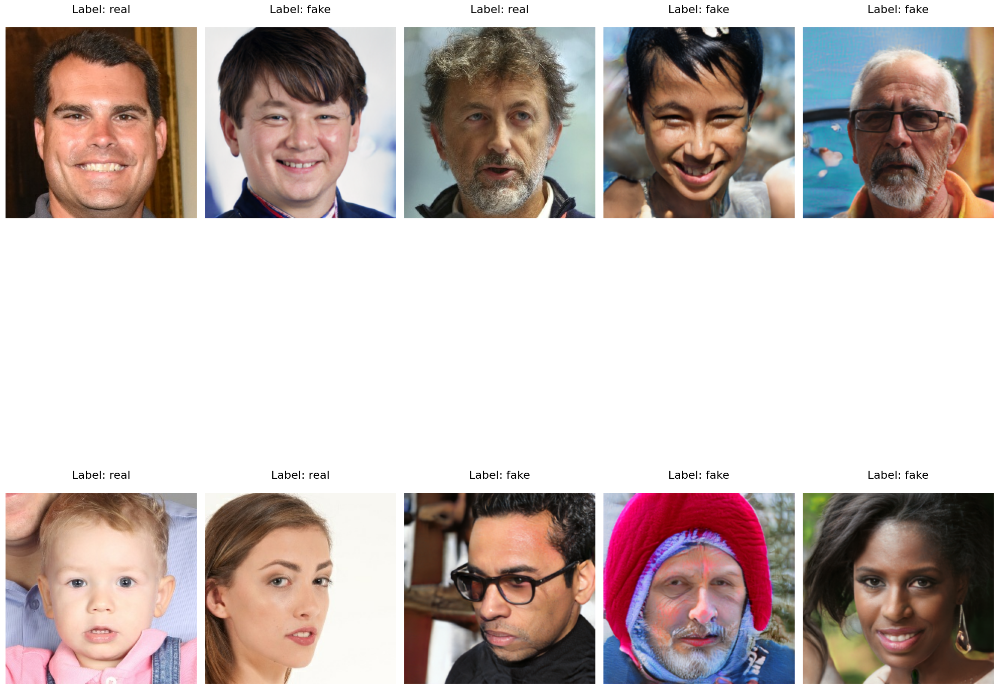

In [45]:
import matplotlib.pyplot as plt
import random
import tensorflow as tf

# Updated function to load and decode an image
def _load(image_path):
    image_data = tf.io.read_file(image_path)
    image = tf.image.decode_image(image_data, channels=3)
    return image.numpy()  # Convert tensor to a NumPy array

def view_multiple_samples(df, sample_loader, count=10, color_map='rgb', fig_size=(14, 10)):
    rows = count // 5
    if count % 5 > 0:
        rows += 1
    
    idx = random.sample(df.index.to_list(), count)   
    print(idx)
    fig = plt.figure(figsize=fig_size, facecolor='white')  # Set the background color to white

    for column, _ in enumerate(idx):
        plt.subplot(rows, 5, column + 1)
        plt.title(f'Label: {df.label[_]}', pad=20, fontsize=16, color='black')  # Set the text color to black
        
        if color_map == 'rgb':
            plt.imshow(sample_loader(df.image_path[_]))
        else:
            plt.imshow(
                tf.image.rgb_to_grayscale(
                    sample_loader(df.image_path[_])), 
                cmap=color_map
            )
        
        # Remove x & y ticks
        plt.xticks([])
        plt.yticks([])
        
    plt.tight_layout()  # Adjust subplots to fit into the figure area
    return

# Ensure you replace 'train_df' with your actual DataFrame
view_multiple_samples(
    train_df, 
    _load, 
    count=10, 
    fig_size=(20, 24)
)


<a id='1.6'></a>
### View Train Labels Distribution

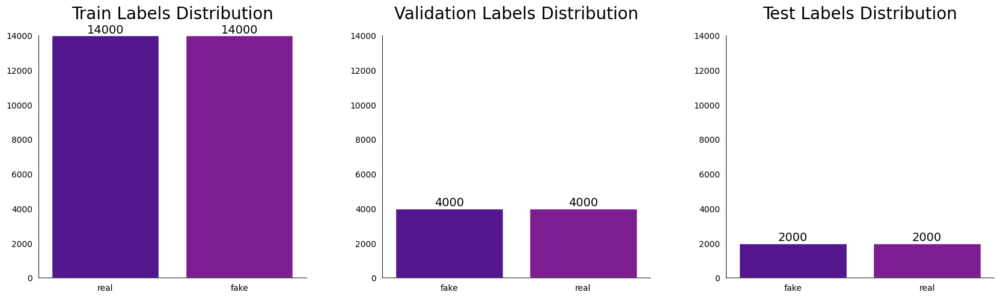

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set Seaborn style to white background with dark elements
sns.set_style("white")

# Create subplots in a single row with three columns
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

# Set the figure background color to white
fig.patch.set_facecolor('white')

# Set the spacing between subplots
fig.tight_layout(pad=6.0)

# Determine the maximum value across all distributions to set a consistent y-axis limit
max_value = max(
    train_df['label'].value_counts().max(),
    val_df['label'].value_counts().max(),
    test_df['label'].value_counts().max()
)

# Plot Train Labels Distribution
ax1.set_title('Train Labels Distribution', fontsize=20, pad=20, color='black')
train_distribution = train_df['label'].value_counts().sort_values()
bar_plot1 = sns.barplot(
    x=list(train_distribution.index),
    y=train_distribution.values,
    orient="v", palette=sns.color_palette("plasma"),
    ax=ax1
)
for container in bar_plot1.containers:
    bar_plot1.bar_label(container, fmt='%.0f', fontsize=14, color='black')
ax1.set_ylim(0, max_value)  # Set the y-axis limit

# Set background color to white
ax1.set_facecolor('white')
ax1.xaxis.label.set_color('black')
ax1.yaxis.label.set_color('black')
ax1.tick_params(colors='black')

# Plot Validation Labels Distribution
ax2.set_title('Validation Labels Distribution', fontsize=20, pad=20, color='black')
val_distribution = val_df['label'].value_counts().sort_values()
bar_plot2 = sns.barplot(
    x=list(val_distribution.index),
    y=val_distribution.values,
    orient="v", palette=sns.color_palette("plasma"),
    ax=ax2
)
for container in bar_plot2.containers:
    bar_plot2.bar_label(container, fmt='%.0f', fontsize=14, color='black')
ax2.set_ylim(0, max_value)  # Set the y-axis limit

# Set background color to white
ax2.set_facecolor('white')
ax2.xaxis.label.set_color('black')
ax2.yaxis.label.set_color('black')
ax2.tick_params(colors='black')

# Plot Test Labels Distribution
ax3.set_title('Test Labels Distribution', fontsize=20, pad=20, color='black')
test_distribution = test_df['label'].value_counts().sort_values()
bar_plot3 = sns.barplot(
    x=list(test_distribution.index),
    y=test_distribution.values,
    orient="v", palette=sns.color_palette("plasma"),
    ax=ax3
)
for container in bar_plot3.containers:
    bar_plot3.bar_label(container, fmt='%.0f', fontsize=14, color='black')
ax3.set_ylim(0, max_value)  # Set the y-axis limit

# Set background color to white
ax3.set_facecolor('white')
ax3.xaxis.label.set_color('black')
ax3.yaxis.label.set_color('black')
ax3.tick_params(colors='black')

# Remove top and right spines
sns.despine()

# Show the plot
plt.show()


<a id='2.3'></a>
### Create an Image Data Augmentation Layer

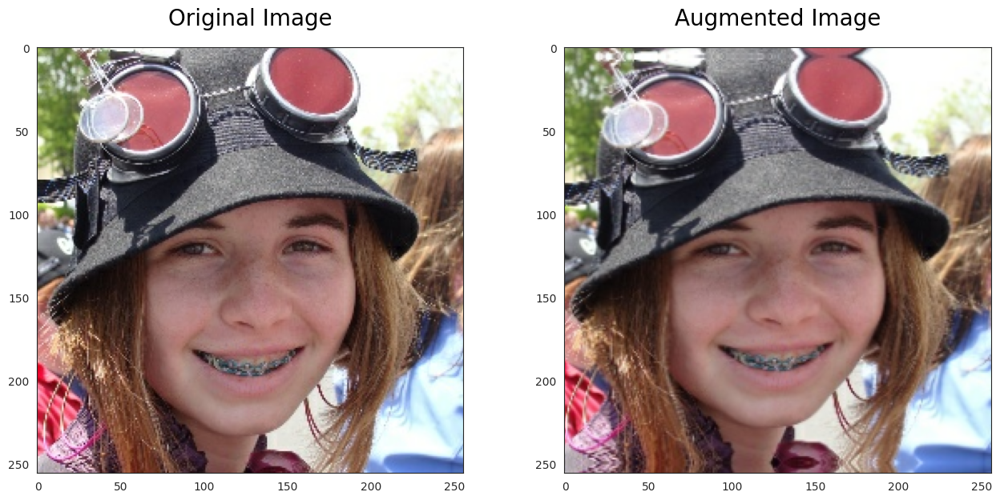

In [47]:
# Select a random image from the DataFrame
random_image_path = random.choice(train_df['image_path'].tolist())
image = _load(random_image_path)

# Normalize the image if it's not already in [0, 1] range
if image.max() > 1:
    image = image / 255.0

# Build augmentation layer
augmentation_layer = Sequential([
    layers.RandomFlip(mode='horizontal_and_vertical', seed=42),
    layers.RandomZoom(height_factor=(-0.1, 0.1), width_factor=(-0.1, 0.1), seed=42),
    # Uncomment and adjust other augmentations as needed
    # layers.RandomRotation(factor=(-0.2, 0.3), seed=42),
], name='augmentation_layer')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10), facecolor='white')

# Set the spacing between subplots
fig.tight_layout(pad=6.0)

# View Original Image
ax1.set_title('Original Image', fontsize=20, pad=20, color='black')
ax1.imshow(image, cmap='mako')

# Convert the image to tensor and add a batch dimension
image_tensor = tf.convert_to_tensor(image)
image_tensor = tf.expand_dims(image_tensor, axis=0)

# Apply augmentation
augmented_image_tensor = augmentation_layer(image_tensor)[0]

# Convert back to NumPy array for visualization
augmented_image = augmented_image_tensor.numpy()

# View Augmented Image
ax2.set_title('Augmented Image', fontsize=20, pad=20, color='black')
ax2.imshow(augmented_image, cmap='mako')

plt.show()

<a id='2.4'></a>
### Create Input Data Pipeline w. tf.data API

In [48]:
def encode_labels(labels, encode_depth=2):
    return tf.one_hot(labels, depth=encode_depth).numpy()

def create_pipeline(df, load_function, augment=False, batch_size=32, shuffle=False, cache=None, prefetch=False):
    '''
    Generates an input pipeline using the tf.data API given a Pandas DataFrame and image loading function.
    
    @params
        - df: (pd.DataFrame) -> DataFrame containing paths and labels 
        - load_function: (function) -> function used to load images given their paths
        - augment: (bool) -> condition for applying augmentation
        - batch_size: (int) -> size for batched (default=32) 
        - shuffle: (bool) -> condition for data shuffling, data is shuffled when True (default=False)
        - cache: (str) -> cache path for caching data, data is not cached when None (default=None)
        - prefetch: (bool) -> condition for prefeching data, data is prefetched when True (default=False)
        
    @returns
        - dataset: (tf.data.Dataset) -> dataset input pipeline used to train a TensorFlow model
    '''
    # Get image paths and labels from DataFrame
    image_paths = df.image_path
    image_labels = encode_labels(df.label_encoded)
    AUTOTUNE = tf.data.AUTOTUNE
    
    # Create dataset with raw data from DataFrame
    ds = tf.data.Dataset.from_tensor_slices((image_paths, image_labels))
    
    # Map augmentation layer and load function to dataset inputs if augment is True
    # Else map only the load function
    if augment:
        ds = ds.map(lambda x, y: (augmentation_layer(load_function(x)), y), num_parallel_calls=AUTOTUNE)
    else:
        ds = ds.map(lambda x, y: (load_function(x), y), num_parallel_calls=AUTOTUNE)
    
    # Apply shuffling based on condition
    if shuffle:
        ds = ds.shuffle(buffer_size=1000)
        
    # Apply batching
    ds = ds.batch(batch_size)
    
    # Apply caching based on condition
    # Note: Use cache in memory (cache='') if the data is small enough to fit in memory!!!
    if cache != None:
        ds = ds.cache(cache)
    
    # Apply prefetching based on condition
    # Note: This will result in memory trade-offs
    if prefetch:
        ds = ds.prefetch(buffer_size=AUTOTUNE)
    
    # Return the dataset
    return ds

In [59]:
# Updated function to load, decode, and resize an image
def _load(image_path):
    image_data = tf.io.read_file(image_path)
    
    # Use specific decoding function for known image formats
    image = tf.image.decode_jpeg(image_data, channels=3)  # Use decode_jpeg or decode_png
    image.set_shape([None, None, 3])  # Set shape to ensure image has a valid rank
    
    image = tf.image.resize(image, IMAGE_SIZE)  # Resize to consistent size
    return image  # Return the TensorFlow tensor directly

def encode_labels(labels, encode_depth=2):
    return tf.one_hot(labels, depth=encode_depth)

def create_pipeline(df, load_function, augment=False, batch_size=32, shuffle=False, cache=None, prefetch=False):
    '''
    Generates an input pipeline using the tf.data API given a Pandas DataFrame and image loading function.
    
    @params
        - df: (pd.DataFrame) -> DataFrame containing paths and labels 
        - load_function: (function) -> function used to load images given their paths
        - augment: (bool) -> condition for applying augmentation
        - batch_size: (int) -> size for batched (default=32) 
        - shuffle: (bool) -> condition for data shuffling, data is shuffled when True (default=False)
        - cache: (str) -> cache path for caching data, data is not cached when None (default=None)
        - prefetch: (bool) -> condition for prefetching data, data is prefetched when True (default=False)
        
    @returns
        - dataset: (tf.data.Dataset) -> dataset input pipeline used to train a TensorFlow model
    '''
    # Get image paths and labels from DataFrame
    image_paths = df.image_path
    image_labels = encode_labels(df.label_encoded)
    AUTOTUNE = tf.data.AUTOTUNE
    
    # Create dataset with raw data from DataFrame
    ds = tf.data.Dataset.from_tensor_slices((image_paths, image_labels))
    
    # Define map function
    def process_path(image_path, label):
        image = load_function(image_path)
        
        # Ensure image has a known shape
        image.set_shape((IMAGE_SIZE[0], IMAGE_SIZE[1], 3))  # Explicitly set shape
        
        # Add a batch dimension for augmentation
        image = tf.expand_dims(image, axis=0)  # Add batch dimension

        if augment:
            image = augmentation_layer(image)
        
        image = tf.squeeze(image, axis=0)  # Remove batch dimension after augmentation
        return image, label
    
    # Map the processing function to dataset inputs
    ds = ds.map(process_path, num_parallel_calls=AUTOTUNE)
    
    # Apply shuffling based on condition
    if shuffle:
        ds = ds.shuffle(buffer_size=1000)
        
    # Apply batching
    ds = ds.batch(batch_size)
    
    # Apply caching based on condition
    if cache is not None:
        ds = ds.cache(cache)
    
    # Apply prefetching based on condition
    if prefetch:
        ds = ds.prefetch(buffer_size=AUTOTUNE)
    
    # Return the dataset
    return ds

In [60]:
# Generate Train Input Pipeline
train_ds = create_pipeline(train_df, _load, augment=True, 
                           batch_size=CFG.BATCH_SIZE, 
                           shuffle=False, prefetch=True)

# Generate Validation Input Pipeline
val_ds = create_pipeline(val_df, _load, 
                         batch_size=CFG.BATCH_SIZE, 
                         shuffle=False, prefetch=False)

# Generate Test Input Pipeline
test_ds = create_pipeline(test_df, _load, 
                          batch_size=CFG.BATCH_SIZE, 
                          shuffle=False, prefetch=False)

In [61]:
# View string representation of datasets
print('========================================')
print('Train Input Data Pipeline:\n\n', train_ds)
print('========================================')
print('Validation Input Data Pipeline:\n\n', val_ds)
print('========================================')
print('Test Input Data Pipeline:\n\n', test_ds)
print('========================================')

Train Input Data Pipeline:

 <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 144, 144, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.float32, name=None))>
Validation Input Data Pipeline:

 <_BatchDataset element_spec=(TensorSpec(shape=(None, 144, 144, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.float32, name=None))>
Test Input Data Pipeline:

 <_BatchDataset element_spec=(TensorSpec(shape=(None, 144, 144, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.float32, name=None))>


<a id='2.4'></a>
### Squeeze-and-Excitation block (SE Block)

In [62]:
import tensorflow as tf
from tensorflow.keras.layers import GlobalAveragePooling2D, Reshape, Dense, Multiply

class SEBlock(tf.keras.layers.Layer):
    def __init__(self, filters, reduction=16):
        super(SEBlock, self).__init__()
        self.global_avg_pool = GlobalAveragePooling2D()
        self.reshape = Reshape((1, 1, filters))
        self.dense1 = Dense(filters // reduction, activation='relu', use_bias=False)
        self.dense2 = Dense(filters, activation='sigmoid', use_bias=False)
        
    def call(self, inputs):
        x = self.global_avg_pool(inputs)
        x = self.reshape(x)
        x = self.dense1(x)
        x = self.dense2(x)
        return Multiply()([inputs, x])


<a id='2.4'></a>
### Tokenizer (Bridge the gap between CNNs and transformers)

In [63]:
class CCTTokenizer(layers.Layer):
    def __init__(
        self,
        kernel_size=3,
        stride=1,
        padding=1,
        pooling_kernel_size=3,
        pooling_stride=2,
        num_conv_layers=2,
        num_output_channels=[64, 128],
        positional_embedding=True,
        **kwargs,
    ):
        super(CCTTokenizer, self).__init__(**kwargs)
        self.tokenizer = Sequential()
        
        for i in range(num_conv_layers):
            # Add Conv Layer
            self.tokenizer.add(
                layers.Conv2D(
                    num_output_channels[i],
                    kernel_size, stride,
                    padding="valid", use_bias=False, 
                    activation="relu", kernel_initializer="he_normal",
                    name=f'tokenizer_conv_{i}'
                )
            )
            # Add SE Block
            self.tokenizer.add(SEBlock(num_output_channels[i]))
            
            # Add Padding Layer
            self.tokenizer.add(
                layers.ZeroPadding2D(padding, name=f'tokenizer_padding_{i}')
            )
            
            # Add MaxPool layer
            self.tokenizer.add(
                layers.MaxPool2D(
                    pooling_kernel_size, 
                    pooling_stride, "same", 
                    name=f'tokenizer_maxpool_2d_{i}'
                )
            )

        self.positional_embedding = positional_embedding

    def __call__(self, images):
        # Tokenize image
        tokenized_image = self.tokenizer(images)
        
        # Flatten spatial dimensions to form sequences
        img_seq = tf.reshape(
            tokenized_image,
            (-1, tf.shape(tokenized_image)[1] * tf.shape(tokenized_image)[2], tf.shape(tokenized_image)[-1]),
        )
        
        return img_seq

    def gen_positional_embedding(self, image_size):
        if self.positional_embedding:
            dummy_inputs = tf.ones((1, image_size, image_size, 3))
            dummy_outputs = self.__call__(dummy_inputs)
            sequence_length = dummy_outputs.shape[1]
            projection_dim = dummy_outputs.shape[-1]

            embedding_layer = layers.Embedding(
                input_dim=sequence_length, output_dim=projection_dim, name='tokenizer_pos_embedding'
            )
            return embedding_layer, sequence_length
        else:
            return None


<a id='2.4'></a>
###  StochasticDepth (randomly drop layers or block to improve their generalization ability)

In [64]:
class StochasticDepth(layers.Layer):
    def __init__(self, droupout_rate, **kwargs):
        super().__init__(**kwargs)
        self.droupout_rate = droupout_rate

    def __call__(self, x, training=None):
        if training:
            # Set survival rate
            survival_rate = 1 - self.droupout_rate
            
            # Define output shape
            shape = (x.shape[0],) + (1,) * (x.shape[0] - 1)
            
            # Generate random dropouts
            random_tensor = survival_rate + tf.random.uniform(shape, 0, 1)
            random_tensor = tf.floor(random_tensor)
            
            return (x / survival_rate) * random_tensor
        
        # Return input if not training 
        return x

<a id='2.4'></a>
### MLP (Serves Transform and refine feature representations, Introduce non-linearity)

In [65]:
def mlp(x, hidden_units, dropout_rate):
    for units in hidden_units:
        x = layers.Dense(units, activation=tf.nn.gelu)(x)
        x = layers.Dropout(dropout_rate)(x)
        x = layers.Dropout(dropout_rate)(x)
    return x

<a id=3.3></a>
## Generate CCT Model

In [66]:
def create_cct_model(
    image_size=CFG.IMAGE_SIZE,
    input_shape=CFG.IMAGE_SHAPE,
    num_heads=CFG.NUM_HEADS,
    projection_dim=CFG.PROJECTION_DIM,
    transformer_units=CFG.TRANSFORMER_UNITS,
    transformer_layers=CFG.TRANSFORMER_LAYERS,
    positional_embedding=CFG.POSITIONAL_EMBEDDING,
    stochastic_depth_rate=CFG.STOCHASTIC_DEPTH_RATE
):
    inputs = layers.Input(input_shape, dtype=tf.float32, name='input_image')

    augmented = augmentation_layer(inputs)

    cct_tokenizer = CCTTokenizer()
    encoded_patches = cct_tokenizer(augmented)

    if positional_embedding:
        pos_embedding_layer, seq_length = cct_tokenizer.gen_positional_embedding(image_size)
        positions = tf.range(start=0, limit=seq_length, delta=1)
        pos_embeddings = pos_embedding_layer(positions)        
        encoded_patches += pos_embeddings

    dpr = [_ for _ in np.linspace(0, stochastic_depth_rate, transformer_layers)]

    for i in range(transformer_layers):
        norm_layer_1 = layers.LayerNormalization(epsilon=1e-5)(encoded_patches)
        attention_output = layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=projection_dim, dropout=0.3
        )(norm_layer_1, norm_layer_1)

        attention_output = StochasticDepth(dpr[i])(attention_output)
        residual_1 = layers.Add()([attention_output, encoded_patches])

        norm_layer_2 = layers.LayerNormalization(epsilon=1e-5)(residual_1)
        mlp_layer = mlp(norm_layer_2, hidden_units=transformer_units, dropout_rate=0.3)

        stochastic_depth_1 = StochasticDepth(dpr[i])(mlp_layer)
        encoded_patches = layers.Add()([stochastic_depth_1, residual_1])

    seq_representation = layers.LayerNormalization(epsilon=1e-5)(encoded_patches)
    attention_weights = tf.nn.softmax(layers.Dense(1)(seq_representation), axis=1)
    weighted_seq_representation = tf.matmul(attention_weights, seq_representation, transpose_a=True)
    weighted_seq_representation = tf.squeeze(weighted_seq_representation, -2)

    output_layer = layers.Dense(CFG.NUM_CLASSES, activation=tf.nn.sigmoid, name='output_layer')(weighted_seq_representation)
    
    model = tf.keras.Model(inputs=[inputs], outputs=[output_layer], name='compact_convolutional_transformer_model')
    
    return model




In [67]:
tf.random.set_seed(CFG.TF_SEED)

# Construct Model
# cct_model = create_cct_model()
cct_model = tf.keras.models.load_model('model_checkpointCCT.h5', custom_objects={'SEBlock': SEBlock, 'CCTTokenizer': CCTTokenizer})

# View model summary
cct_model.summary()

Model: "compact_convolutional_transformer_model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 144, 144, 3)]        0         []                            
                                                                                                  
 augmentation_layer (Sequen  (144, 144, None)             0         ['input_image[0][0]']         
 tial)                                                                                            
                                                                                                  
 sequential (Sequential)     (None, 36, 36, 128)          78016     ['augmentation_layer[0][0]']  
                                                                                                  
 tf.compat.v1.shape (TFOpLa  (4,)                         0 

 dense_6 (Dense)             (None, 1296, 128)            16512     ['layer_normalization_3[0][0]'
                                                                    ]                             
                                                                                                  
 dropout_4 (Dropout)         (None, 1296, 128)            0         ['dense_6[0][0]']             
                                                                                                  
 dropout_5 (Dropout)         (None, 1296, 128)            0         ['dropout_4[0][0]']           
                                                                                                  
 dense_7 (Dense)             (None, 1296, 128)            16512     ['dropout_5[0][0]']           
                                                                                                  
 dropout_6 (Dropout)         (None, 1296, 128)            0         ['dense_7[0][0]']             
          

                                                                                                  
 tf.linalg.matmul (TFOpLamb  (None, 1, 128)               0         ['tf.nn.softmax[0][0]',       
 da)                                                                 'layer_normalization_8[0][0]'
                                                                    ]                             
                                                                                                  
 tf.compat.v1.squeeze (TFOp  (None, 128)                  0         ['tf.linalg.matmul[0][0]']    
 Lambda)                                                                                          
                                                                                                  
 output_layer (Dense)        (None, 2)                    258       ['tf.compat.v1.squeeze[0][0]']
                                                                                                  
Total para

<div class="alert alert-block alert-info">
<br>
We see that our <b>CCT Model consists of ~0.74M total parameters</b>. This is <b>astronomically less</b> than that of the <b>Vision Transformer (~86.0M parameters)</b> and <b>EfficientNet V2 (~6.0M parameters)</b> model variants.
</div>

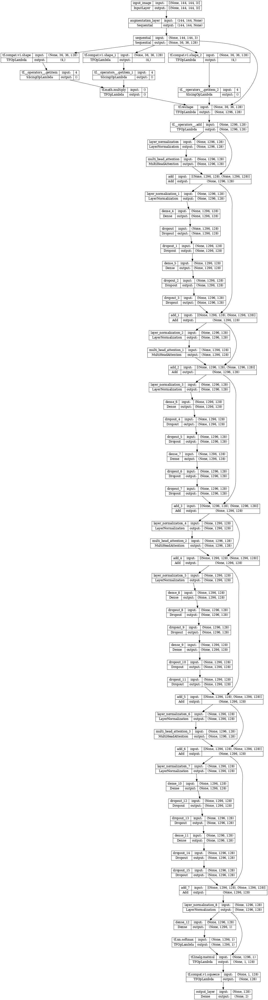

In [68]:
# Explore model visually
plot_model(
    cct_model, dpi=60,
    show_shapes=True
)

<a id='2.4'></a>
### OneCycleScheduler (a learning rate scheduling technique)

In [69]:
import tensorflow as tf
from tensorflow.keras.callbacks import Callback
import keras.backend as K

class OneCycleScheduler(Callback):
    def __init__(self, iterations, max_rate, start_rate=None,
                 last_iterations=None, last_rate=None):
        self.iterations = iterations
        self.max_rate = max_rate
        self.start_rate = start_rate or max_rate / 10
        self.last_iterations = last_iterations or iterations // 10 + 1
        self.half_iteration = (iterations - self.last_iterations) // 2
        self.last_rate = last_rate or self.start_rate / 1000
        self.iteration = 0

    def _interpolate(self, iter1, iter2, rate1, rate2):
        return ((rate2 - rate1) * (self.iteration - iter1)
                / (iter2 - iter1) + rate1)

    def on_batch_begin(self, batch, logs=None):
        if self.iteration < self.half_iteration:
            rate = self._interpolate(0, self.half_iteration, self.start_rate, self.max_rate)
        elif self.iteration < 2 * self.half_iteration:
            rate = self._interpolate(self.half_iteration, 2 * self.half_iteration,
                                     self.max_rate, self.start_rate)
        else:
            rate = self._interpolate(2 * self.half_iteration, self.iterations,
                                     self.start_rate, self.last_rate)
        self.iteration += 1
        K.set_value(self.model.optimizer.lr, rate)
steps_per_epoch = len(train_ds)

# Calculate total iterations
total_iterations = CFG.EPOCHS * steps_per_epoch

In [70]:
# Define Early Stopping Callback
early_stopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', 
    patience=20, 
    restore_best_weights=True)

# (Optional) Define Reduce Learning Rate Callback
reduce_lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    patience=6,
    factor=0.1,
    verbose=1)

model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='model_checkpointCCT.h5',
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)

# Create the OneCycleScheduler callback
one_cycle_scheduler = OneCycleScheduler(
    iterations=total_iterations,
    max_rate=0.001,  # Adjust max learning rate as needed
    start_rate=0.0001,  # Adjust start learning rate as needed
    last_rate=0.00001  # Adjust last learning rate as needed
)

# Define Callbacks and Metrics lists
CALLBACKS = [
    early_stopping_callback,
    model_checkpoint_callback,
    one_cycle_scheduler
#     reduce_lr_callback
]

METRICS = ['accuracy']

In [71]:
tf.random.set_seed(CFG.TF_SEED)

# Compile the model
cct_model.compile(
    loss=tf.keras.losses.BinaryCrossentropy(label_smoothing=0.2),
    optimizer=tf.optimizers.AdamW(learning_rate=CFG.LEARNING_RATE, weight_decay=CFG.WEIGHT_DECAY),
    metrics=METRICS
)

# Train the model 
print(f'Training {cct_model.name}.')
print(f'Train on {len(train_df)} samples, validate on {len(val_df)} samples.')
print('----------------------------------')

# cct_model_history = cct_model.fit(
#     train_ds,
#     validation_data=val_ds,
#     batch_size=CFG.BATCH_SIZE,
#     epochs=CFG.EPOCHS,
#     callbacks=CALLBACKS,
# )

Training compact_convolutional_transformer_model.
Train on 28000 samples, validate on 8000 samples.
----------------------------------


In [74]:
# Generate model probabilities and associated predictions
cct_test_probabilities = cct_model.predict(test_ds, verbose=1)
cct_test_predictions = tf.argmax(cct_test_probabilities, axis=1)

63/63 [==============================] - 5s 63ms/step


<a id='5.1'></a>
### Plot Model Histories 

In [75]:


import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_training_curves(history, save_path=None):
    loss = np.array(history.history['loss'])
    val_loss = np.array(history.history['val_loss'])

    accuracy = np.array(history.history['accuracy'])
    val_accuracy = np.array(history.history['val_accuracy'])

    epochs = range(len(history.history['loss']))

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    # Plot loss
    ax1.plot(epochs, loss, label='training_loss', marker='o', color='C5')
    ax1.plot(epochs, val_loss, label='val_loss', marker='o', color='C6')
    
    ax1.fill_between(epochs, loss, val_loss, where=(loss > val_loss), color='C5', alpha=0.3, interpolate=True)
    ax1.fill_between(epochs, loss, val_loss, where=(loss < val_loss), color='C6', alpha=0.3, interpolate=True)

    ax1.set_title('Loss (Lower Means Better)', fontsize=16)
    ax1.set_xlabel('Epochs', fontsize=12)
    ax1.legend(fontsize=12)

    # Plot accuracy
    ax2.plot(epochs, accuracy, label='training_accuracy', marker='o', color='C5')
    ax2.plot(epochs, val_accuracy, label='val_accuracy', marker='o', color='C6')
    
    ax2.fill_between(epochs, accuracy, val_accuracy, where=(accuracy > val_accuracy), color='C5', alpha=0.3, interpolate=True)
    ax2.fill_between(epochs, accuracy, val_accuracy, where=(accuracy < val_accuracy), color='C6', alpha=0.3, interpolate=True)

    ax2.set_title('Accuracy (Higher Means Better)', fontsize=16)
    ax2.set_xlabel('Epochs', fontsize=12)
    ax2.legend(fontsize=12)

    # Save the plot if save_path is provided
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')

    plt.show()

# Example usage:
# plot_training_curves(history, save_path='/kaggle/working/training_curves.png')


In [76]:
import pandas as pd

def save_training_history_to_csv(history, filename):
    # Convert the history to a DataFrame
    history_df = pd.DataFrame(history.history)
    # Save the DataFrame to a CSV file
    history_df.to_csv(filename, index=False)

# Example usage:
save_training_history_to_csv(cct_model_history, './dropout_both0.5/training_history.csv')


NameError: name 'cct_model_history' is not defined

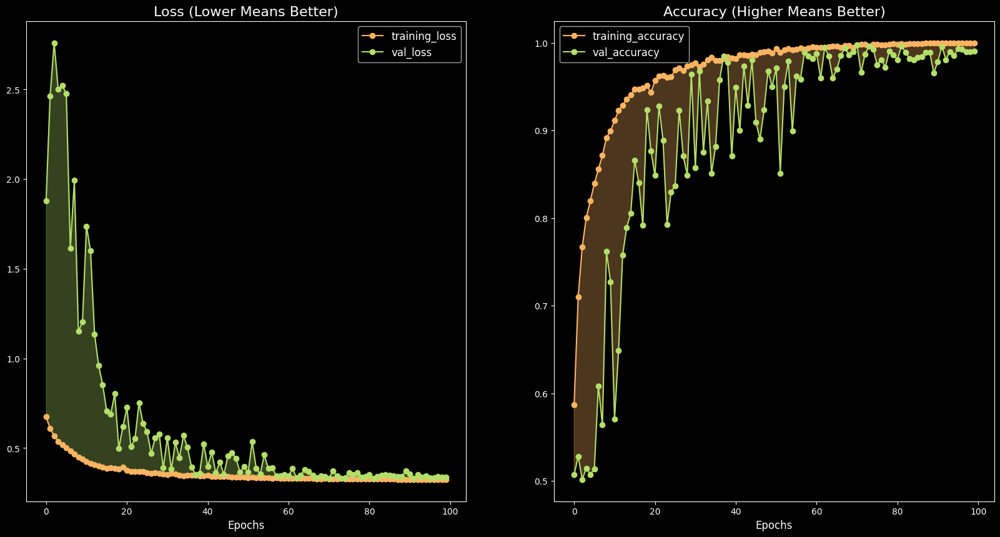

In [37]:
# plot cct model training history 
plot_training_curves(cct_model_history, save_path='./dropout_both0.5/training_curves.png')

<div class="alert alert-block alert-info">
<br>
Here we see that our CCT Model loss initially converges at a stable rate, and becomes more unstable as the model trains after ~15 epochs. Some overfitting might have occured, which, if so, would explain this behaviour in the loss convergence. 
</div>

<a id='5.2'></a>
### Plot Confusion Matrix

In [78]:

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(y_true, y_pred, classes='auto', figsize=(10, 10), text_size=12, save_path=None): 
    # Generate confusion matrix 
    cm = confusion_matrix(y_true, y_pred)
    
    # Set plot size
    plt.figure(figsize=figsize)

    # Create confusion matrix heatmap
    disp = sns.heatmap(
        cm, annot=True, cmap='Greens',
        annot_kws={"size": text_size}, fmt='g',
        linewidths=0.1, linecolor='black', clip_on=False,
        xticklabels=classes, yticklabels=classes)
    
    # Set title and axis labels
    disp.set_title('Confusion Matrix', fontsize=24)
    disp.set_xlabel('Predicted Label', fontsize=20) 
    disp.set_ylabel('True Label', fontsize=20)
    plt.yticks(rotation=0) 

    # Save the plot if save_path is provided
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')

    # Plot confusion matrix
    plt.show()

# Example usage:
# plot_confusion_matrix(y_true, y_pred, classes=['Class1', 'Class2'], save_path='confusion_matrix.png')


In [82]:
class_names = ['fake', 'real']

plot_confusion_matrix(
    test_df.label_encoded, 
    cct_test_predictions, 
    figsize=(8, 8), 
    classes=class_names,
    save_path='./dropout_both0.5/confusion_matrix.png'
    
)

NameError: name 'plot_confusion_matrixx' is not defined

In [40]:
class_names

['fake', 'real']

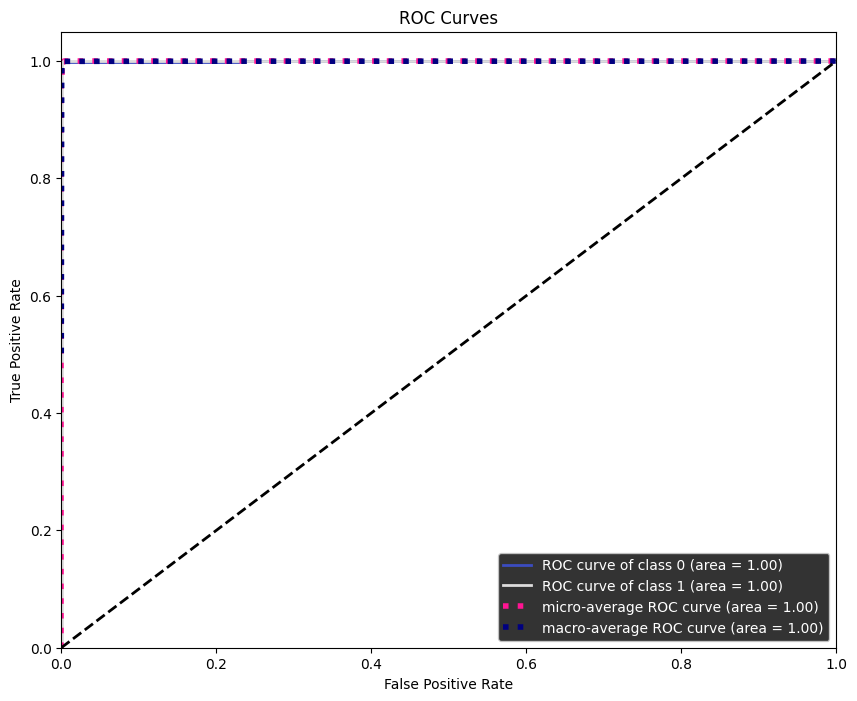

In [36]:
# Assuming you have the plot_roc function and necessary imports done

# Create the ROC plot
plot_roc(
    test_df.label_encoded, 
    cct_test_probabilities, 
    figsize=(10, 8), 
    title_fontsize='large',
    cmap='coolwarm'
)

# Set the figure and axis backgrounds to white
plt.gcf().set_facecolor('white')  # Set the figure background to white
ax = plt.gca()  # Get the current axes
ax.set_facecolor('white')  # Set the axes background to white

# Customize the text and line colors to be dark
for spine in ax.spines.values():
    spine.set_edgecolor('black')  # Set the border of the plot to black

ax.title.set_color('black')  # Set the title color to black
ax.xaxis.label.set_color('black')  # Set the x-axis label color to black
ax.yaxis.label.set_color('black')  # Set the y-axis label color to black
ax.tick_params(colors='black')  # Set the tick label colors to black

# Save the plot with the desired settings
plt.savefig('./dropout_both0.5/roc_curve.png', format='png', dpi=300, facecolor='white')  # Set facecolor to white when saving

plt.show()


<a id='5.4'></a>
### View Classification Report

In [42]:
report = classification_report(
    test_df.label_encoded, 
    cct_test_predictions, 
    target_names=class_names
)

# Print the classification report
print(report)

# Save the classification report to a file
with open('./dropout_both0.5/classification_report.txt', 'w') as f:
    f.write(report)

              precision    recall  f1-score   support

        fake       1.00      0.99      0.99      2000
        real       0.99      1.00      0.99      2000

    accuracy                           0.99      4000
   macro avg       0.99      0.99      0.99      4000
weighted avg       0.99      0.99      0.99      4000



<a id='5.5'></a>
### Record Classification Metrics

In [43]:
def generate_performance_scores(y_true, y_pred, y_probabilities, filename='./dropout_both0.5/performance_scores.txt'):
    model_accuracy = accuracy_score(y_true, y_pred)
    model_precision, model_recall, model_f1, _ = precision_recall_fscore_support(y_true, 
                                                                                 y_pred, 
                                                                                 average="weighted")
    model_matthews_corrcoef = matthews_corrcoef(y_true, y_pred)
    
    # Prepare the performance metrics string
    performance_metrics = (
        '=============================================\n'
        'Performance Metrics:\n'
        '=============================================\n'
        f'accuracy_score:\t\t{model_accuracy:.4f}\n'
        '_____________________________________________\n'
        f'precision_score:\t{model_precision:.4f}\n'
        '_____________________________________________\n'
        f'recall_score:\t\t{model_recall:.4f}\n'
        '_____________________________________________\n'
        f'f1_score:\t\t{model_f1:.4f}\n'
        '_____________________________________________\n'
        f'matthews_corrcoef:\t{model_matthews_corrcoef:.4f}\n'
        '=============================================\n'
    )
    
    # Print the performance metrics to the console
    print(performance_metrics)
    
    # Save the performance metrics to a file
    with open(filename, 'w') as f:
        f.write(performance_metrics)
    
    performance_scores = {
        'accuracy_score': model_accuracy,
        'precision_score': model_precision,
        'recall_score': model_recall,
        'f1_score': model_f1,
        'matthews_corrcoef': model_matthews_corrcoef
    }
    
    return performance_scores



In [44]:
# Record CCT model performance scores and save to a file
cct_performance = generate_performance_scores(
    test_df.label_encoded, 
    cct_test_predictions, 
    cct_test_probabilities
)

Performance Metrics:
accuracy_score:		0.9942
_____________________________________________
precision_score:	0.9943
_____________________________________________
recall_score:		0.9942
_____________________________________________
f1_score:		0.9942
_____________________________________________
matthews_corrcoef:	0.9886



<div class="alert alert-block alert-info">
<br>
Here we see that the CCT Model is able to achieve a good Matthew's Correlation Coefficient (MCC), which validates the strength of the model. An MCC closer to 1.0 in an indication that a models predictions are statistically of high quality and that the model is capable of predicting on unseen data.
</div>

### View sample predictions

In [45]:
test_df

,image_path,label,label_encoded
0,../dataset 20000/test/fake/image_13521.png,fake,0
1,../dataset 20000/test/real/14070.jpg,real,1
2,../dataset 20000/test/fake/image_13305.png,fake,0
3,../dataset 20000/test/real/17855.jpg,real,1
4,../dataset 20000/test/real/09552.jpg,real,1
...,...,...,...
3995,../dataset 20000/test/fake/image_17615.png,fake,0
3996,../dataset 20000/test/fake/image_18577.png,fake,0
3997,../dataset 20000/test/fake/image_15816.png,fake,0
3998,../dataset 20000/test/real/14187.jpg,real,1


In [39]:
import matplotlib.pyplot as plt
import random
import numpy as np
import tensorflow as tf

def view_multiple_predictions(df, model, sample_loader, count=10, color_map='rgb', fig_size=(14, 10)):
    rows = count // 5
    if count % 5 > 0:
        rows += 1
    
    idx = random.sample(df.index.to_list(), count)
    fig = plt.figure(figsize=fig_size)
    
    # Setup useful dictionaries
    label_set = {0: 'fake', 1: 'real'}
    color_set = {False: 'red', True: 'white'}
    
    for column, _ in enumerate(idx):
        
        # Predict label
        img = sample_loader(df.image_path[_])
        probability = np.squeeze(
            model.predict(np.array([img]), verbose=0)
        )
        prediction = np.argmax(probability)
        
        # Validate prediction correctness
        correct_prediction = (prediction == df.label_encoded[_])
        
        # Setup subplot & title
        ax = plt.subplot(rows, 5, column + 1)
        ax.set_title(
            f'Actual Label: {df.label[_]}', 
            pad=20, 
            fontsize=14,
            color=color_set[correct_prediction]
        )
        
        # Plot image
        if color_map == 'rgb':
            ax.imshow(img)
        else:
            ax.imshow(tf.image.rgb_to_grayscale(img), cmap=color_map)
        
        ax.set_xticks([])
        ax.set_yticks([])
        
        # Plot prediction & probability
        txt = f'Prediction: {label_set[prediction]}\nProbability: {(100 * probability[prediction]):.2f}%'
        plt.xlabel(txt, fontsize=14, color=color_set[correct_prediction])
    
    # Save the figure
    plt.savefig('./dropout_both0.5/multiple_predictions.png', bbox_inches='tight')  # Adjust path and file name as needed

    plt.show()

# Example usage:
# view_multiple_predictions(df, model, sample_loader, count=10, color_map='gray', fig_size=(14, 10))


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

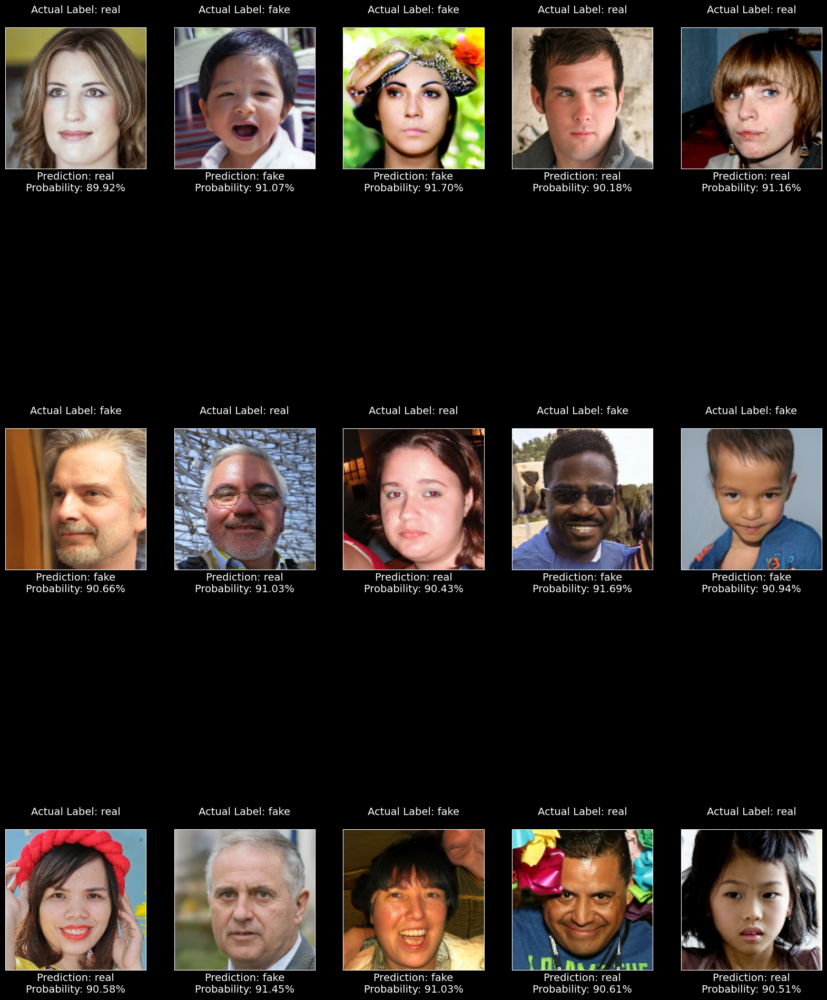

In [41]:
view_multiple_predictions(
    test_df,
    cct_model,
    _load, 
    count=15, 
#     color_map='mako', 
    fig_size=(20, 28)
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


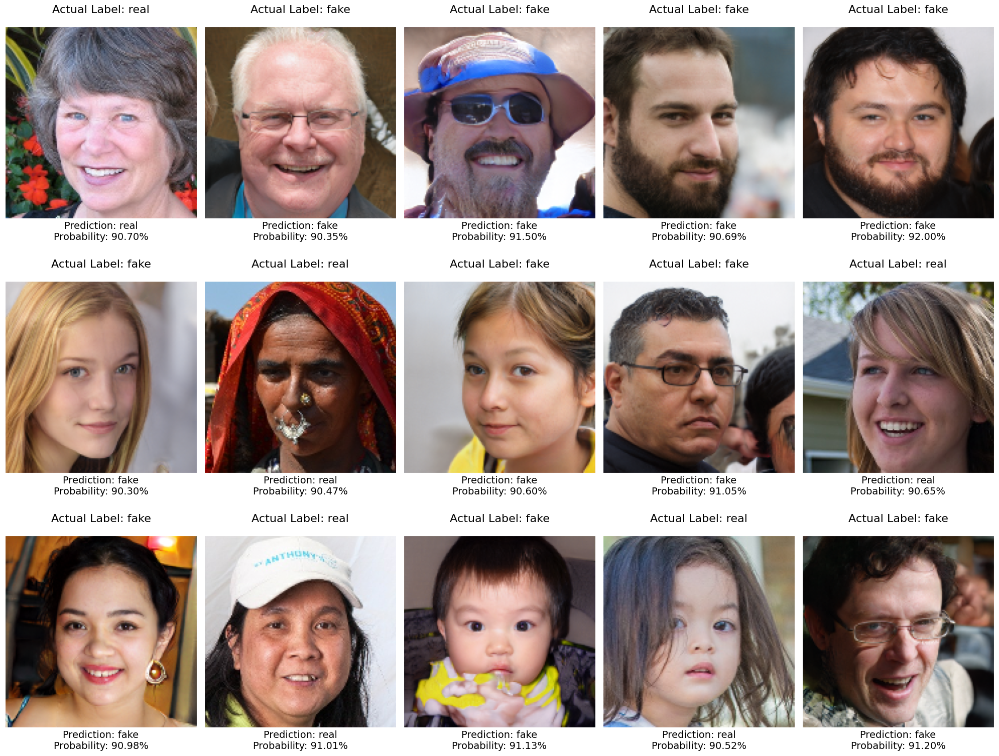

In [31]:
import matplotlib.pyplot as plt
import random
import numpy as np
import tensorflow as tf

def view_multiple_predictions(df, model, sample_loader, count=15, color_map='rgb', fig_size=(20, 16)):
    rows = 3  # Fixed number of rows
    cols = 5  # Fixed number of columns

    idx = random.sample(df.index.to_list(), count)
    fig, axs = plt.subplots(rows, cols, figsize=fig_size)
    
    # Setup useful dictionaries
    label_set = {0: 'fake', 1: 'real'}
    color_set = {False: 'black', True: 'black'}  # Set text color to black for all cases
    
    # Set the overall figure background to white
    fig.patch.set_facecolor('white')
    
    for i in range(rows):
        for j in range(cols):
            idx_pos = i * cols + j
            _ = idx[idx_pos]
            
            # Predict label
            img = sample_loader(df.image_path[_])
            probability = np.squeeze(
                model.predict(np.array([img]), verbose=0)
            )
            prediction = np.argmax(probability)
            
            # Validate prediction correctness
            correct_prediction = (prediction == df.label_encoded[_])
            
            # Setup subplot & title
            axs[i, j].set_title(
                f'Actual Label: {df.label[_]}', 
                pad=20, 
                fontsize=16,  # Increased font size
                color=color_set[correct_prediction]
            )
            
            # Plot image
            if color_map == 'rgb':
                axs[i, j].imshow(img)
            else:
                axs[i, j].imshow(tf.image.rgb_to_grayscale(img), cmap=color_map)
            
            axs[i, j].set_xticks([])
            axs[i, j].set_yticks([])
            
            # Plot prediction & probability
            txt = f'Prediction: {label_set[prediction]}\nProbability: {(100 * probability[prediction]):.2f}%'
            axs[i, j].set_xlabel(txt, fontsize=14, color=color_set[correct_prediction])  # Increased font size

            # Set the subplot background color to white
            axs[i, j].set_facecolor('white')

    # Adjust layout to ensure everything fits well
    plt.subplots_adjust(hspace=0.6)  # Add space between rows
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Ensure everything fits well
    
    # Save the figure with a white background
    plt.savefig('multiple_predictions_15_with_white_bg_black_text.png', bbox_inches='tight', facecolor='white')  # Ensure the facecolor is set to white

    plt.show()

# Example usage:
view_multiple_predictions(
    test_df,
    cct_model,
    _load, 
    count=15, 
    fig_size=(20, 16)
)
